In [1]:
%load_ext autoreload
%autoreload 2

import pickle

In [2]:
from os import listdir
from os.path import isfile, join

import numpy as np
from koala import graph_utils as gu
from koala import plotting as pl
from koala.lattice import Lattice
from matplotlib import pyplot as plt
from tqdm import tqdm

mypath = "results/2000_4707"
filenames = sorted([f for f in listdir(mypath) if isfile(join(mypath, f))])


In [3]:
import sys  # this is a dumb fix

sys.path.append("full_run")


results = []
for file in filenames:
    loc = f"{mypath}/{file}"
    with open(loc, "rb") as f:
        results.append(pickle.load(f))


In [4]:
lattice = Lattice(*results[0]["lattice"])


def curvature(lattice):
    vert_adj = lattice.vertices.adjacent_plaquettes
    n_sides = np.array([p.n_sides for p in lattice.plaquettes])
    sides_adj = n_sides[vert_adj]
    curvature = 0.5 - np.sum(1 / sides_adj, axis=1)
    return curvature

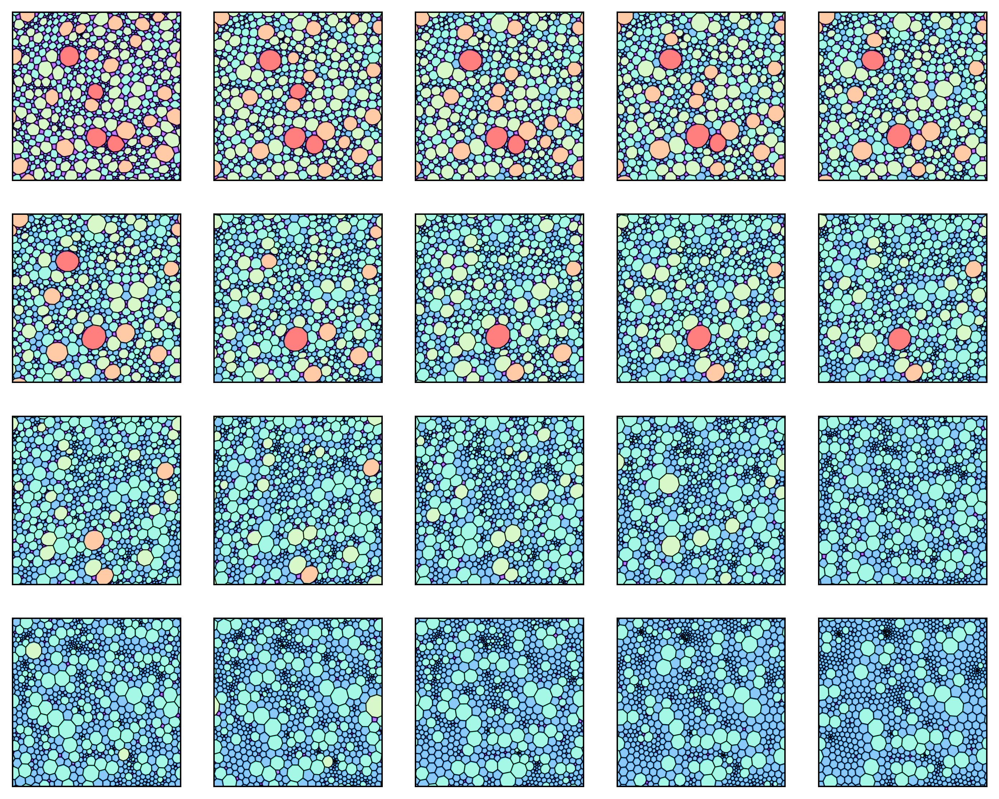

In [5]:
cmap = plt.get_cmap("rainbow")
max_sides = 10

ratio = len(results) / (5 * 5)
fig, ax = plt.subplots(len(results) // 5, 5, figsize=(10, 10 * ratio), dpi=350)

for a, r in zip(ax.flatten(), results, strict=True):
    a.set_xticks([])
    a.set_yticks([])
    lattice = Lattice(*r["lattice"])
    pl.plot_edges(lattice, ax=a, linewidth=0.5)

    sides = np.array([p.n_sides for p in lattice.plaquettes]) - 4
    s = sides / max_sides
    color_scheme = cmap(s)
    pl.plot_plaquettes(
        lattice, ax=a, labels=np.arange(len(sides)), color_scheme=color_scheme, alpha=0.5
    )

    a.set_aspect("equal")


In [6]:
dists = []
dual_dists = []
for i in tqdm(range(len(results))):
    r = results[i]
    lattice = Lattice(*r["lattice"])
    dual = gu.make_dual(lattice)
    dists.append(gu.distance_matrix(lattice))
    dual_dists.append(gu.distance_matrix(dual))

100%|██████████| 20/20 [02:11<00:00,  6.58s/it]


Start with dimer-dimer results

In [7]:
def edge_separation(distance_matrix, vertices_pairs):
    options = np.array(
        (
            distance_matrix[vertices_pairs[:, 0, 0], vertices_pairs[:, 1, 0]],
            distance_matrix[vertices_pairs[:, 0, 0], vertices_pairs[:, 1, 1]],
            distance_matrix[vertices_pairs[:, 0, 1], vertices_pairs[:, 1, 0]],
            distance_matrix[vertices_pairs[:, 0, 1], vertices_pairs[:, 1, 1]],
        )
    )
    return np.min(options, axis=0)


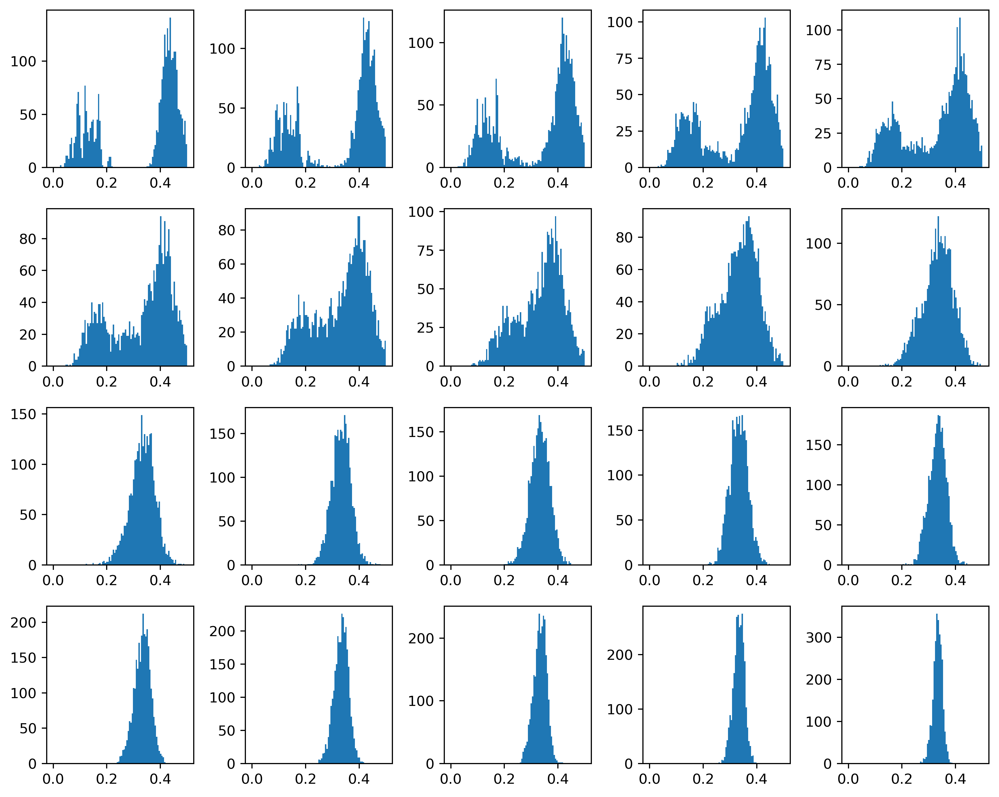

In [8]:
ratio = len(results) / (5 * 5)
fig, ax = plt.subplots(len(results) // 5, 5, figsize=(10, 10 * ratio), dpi=350)

for i in range(len(results)):
    a = ax.flatten()[i]
    r = results[i]
    edge_probs = r["edge_probabilities"]

    bins = np.linspace(0, 0.5, 100)

    a.hist(edge_probs, bins=bins)

plt.tight_layout()

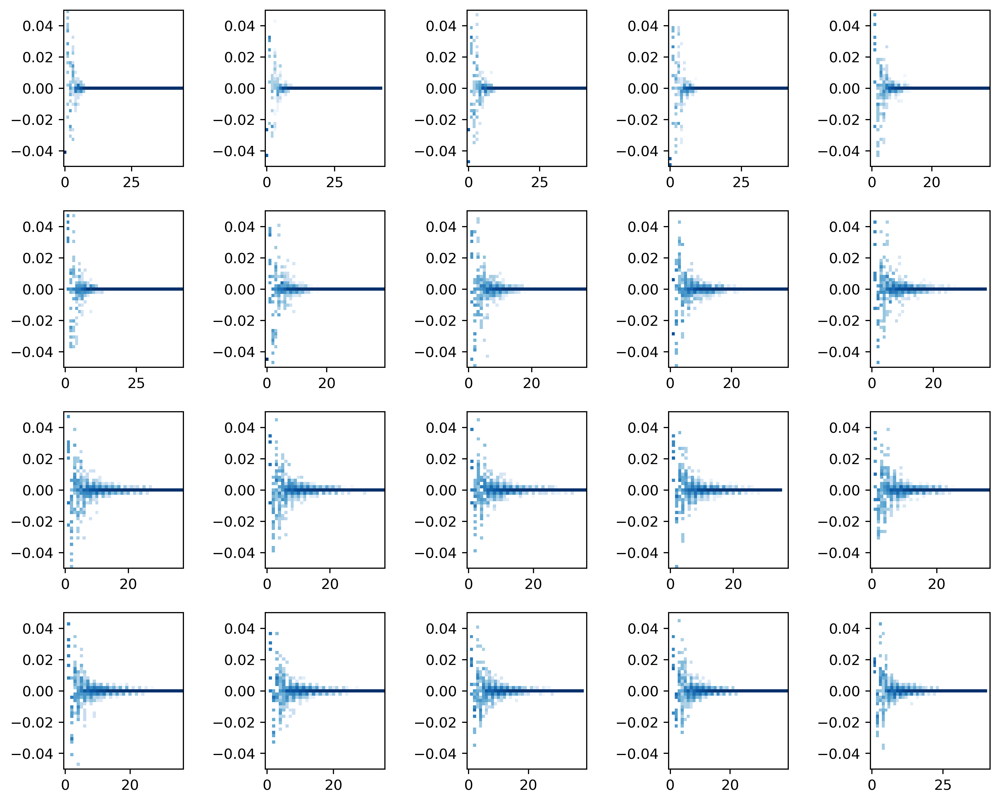

In [ ]:
from matplotlib.colors import LogNorm


ratio = len(results) / (5 * 5)
fig, ax = plt.subplots(len(results) // 5, 5, figsize=(10, 10 * ratio), dpi=350)

for i in range(len(results)):
    a = ax.flatten()[i]
    r = results[i]
    edge_probs = r["edge_probabilities"]
    distance_matrix = dists[i]
    lattice = Lattice(*r["lattice"])
    multi_probabilities = r["multi_probabilities"]
    edges = r["edge_list"]

    vertices_pairs = lattice.edges.indices[edges]
    ds = edge_separation(distance_matrix, vertices_pairs)
    individual_probabilities = edge_probs[edges]

    correlations = np.abs(multi_probabilities - np.prod(individual_probabilities, axis=1))
    # print(np.min(correlations), np.max(correlations))

    x_space = np.arange(0, np.max(ds) + 1) + 0.5
    y_space = np.linspace(-0.05, 0.05, 50)

    # --- 2D histogram (counts) ---
    H, xedges, yedges = np.histogram2d(ds, correlations, bins=(x_space - 1, y_space))

    # --- normalize over y for each x (conditional P(y|x)) ---
    row_sums = H.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # avoid division by zero
    P = H / row_sums

    # --- plot ---
    im = a.pcolormesh(xedges, yedges, P.T, cmap="Blues", norm=LogNorm())

plt.tight_layout()


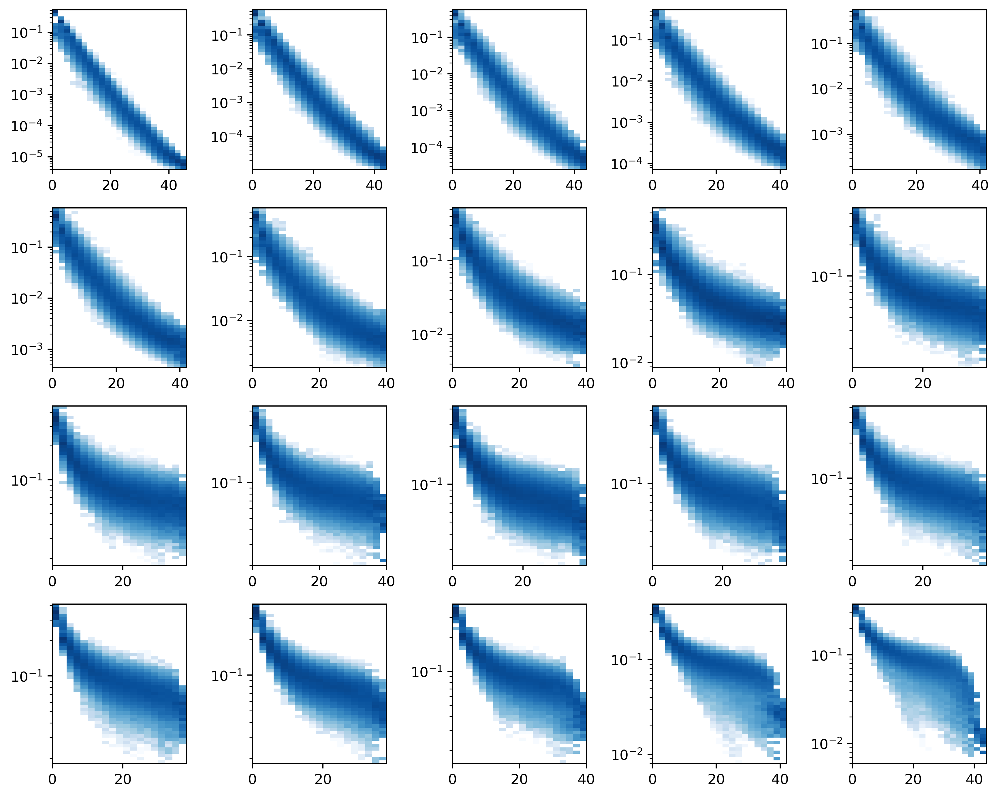

In [10]:
from matplotlib.colors import LogNorm

ratio = len(results) / (5 * 5)
fig, ax = plt.subplots(len(results) // 5, 5, figsize=(10, 10 * ratio), dpi=350)

for i in range(len(results)):
    a = ax.flatten()[i]
    r = results[i]
    distance_matrix = dists[i]
    monomers = r["monomers"]
    n_dims = r["n_dimerisations"]

    distances = np.array([distance_matrix[k] for k in monomers])
    probabilities = np.array([monomers[k] / n_dims for k in monomers]).astype(float)

    x_space = np.arange(np.min(distances), np.max(distances) + 1)[::2]
    y_space = np.logspace(
        np.log10(np.min(probabilities)),
        np.log10(np.max(probabilities)),
        num=50,
    )

    # --- 2D histogram (counts) ---
    H, xedges, yedges = np.histogram2d(distances, probabilities, bins=(x_space - 1, y_space))

    # --- normalize over y for each x (conditional P(y|x)) ---
    row_sums = H.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # avoid division by zero
    P = H / row_sums

    # --- plot ---
    im = a.pcolormesh(xedges, yedges, P.T, cmap="Blues", norm=LogNorm())
    a.set_yscale("log")
    # a.set_xscale("log")

plt.tight_layout()

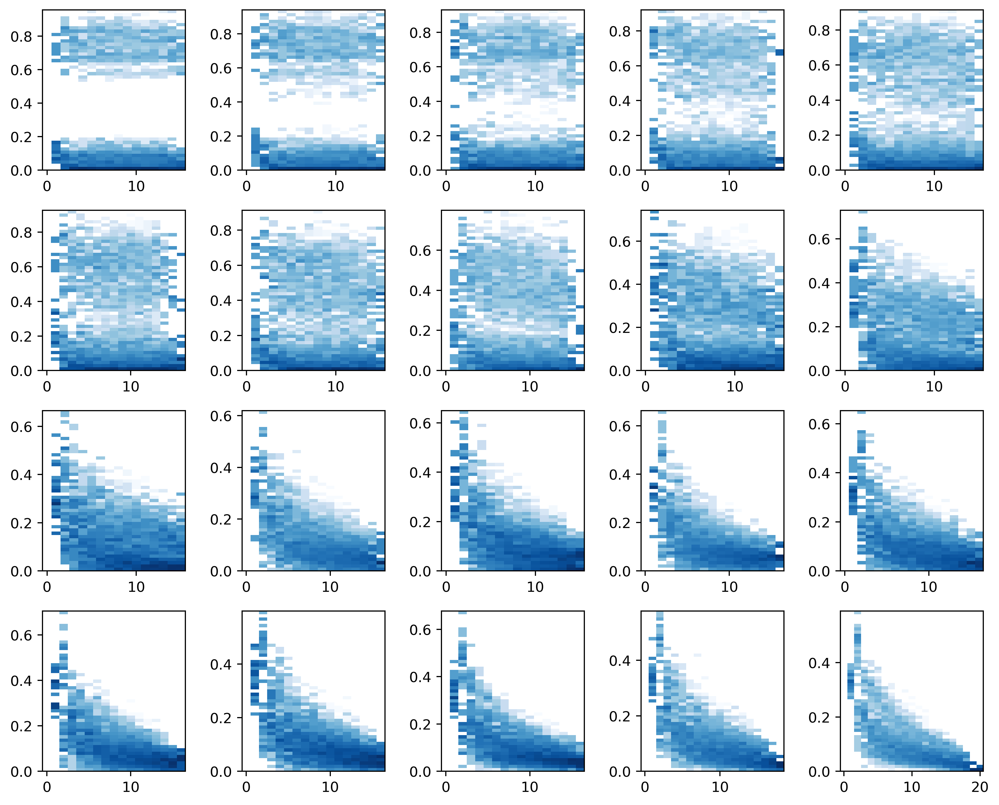

In [11]:
ratio = len(results) / (5 * 5)
fig, ax = plt.subplots(len(results) // 5, 5, figsize=(10, 10 * ratio), dpi=350)

for i in range(len(results)):
    a = ax.flatten()[i]
    r = results[i]
    dual_distance_matrix = dual_dists[i]
    visons = r["visons"]
    plaqs = r["plaq_list"]
    distances = np.array([dual_distance_matrix[tuple(p)] for p in plaqs])
    n_dims = r["n_dimerisations"]

    vison_corrs = (visons / n_dims).astype(float)

    x_space = np.arange(0, np.max(distances) + 1) + 0.5
    y_space = np.linspace(
        0,
        np.max(vison_corrs),
        num=50,
    )

    # --- 2D histogram (counts) ---
    H, xedges, yedges = np.histogram2d(distances, vison_corrs, bins=(x_space - 1, y_space))

    # --- normalize over y for each x (conditional P(y|x)) ---
    row_sums = H.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # avoid division by zero
    P = H / row_sums

    # --- plot ---
    im = a.pcolormesh(xedges, yedges, P.T, cmap="Blues", norm=LogNorm())
    # a.set_yscale("log")

plt.tight_layout()